!pip freeze

In [0]:
!pip show tensorflow

Name: tensorflow
Version: 1.13.1
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: opensource@google.com
License: Apache 2.0
Location: /usr/local/lib/python3.6/dist-packages
Requires: numpy, tensorflow-estimator, tensorboard, astor, keras-applications, termcolor, keras-preprocessing, six, protobuf, wheel, gast, grpcio, absl-py
Required-by: stable-baselines, magenta, fancyimpute


In [0]:
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [0]:
%cd /content/gdrive/My\ Drive/Colab\ Notebooks/application_util
!ls -l
%cd ..
!ls -l

/content/gdrive/My Drive/Colab Notebooks/application_util
total 23
-rw------- 1 root root 11615 Jun 10 15:47 image_viewer.py
-rw------- 1 root root    26 Jun 10 15:12 __init__.py
-rw------- 1 root root  1914 Jun 10 15:12 preprocessing.py
drwx------ 2 root root  4096 Jun 10 15:50 __pycache__
-rw------- 1 root root  4183 Jun 10 15:12 visualization.py
/content/gdrive/My Drive/Colab Notebooks
total 47
drwx------ 3 root root  4096 Jun 10 15:18 application_util
drwx------ 3 root root  4096 Jun 10 14:46 deep_sort
-rw------- 1 root root 23104 Jun 10 15:50 deep_sort_app.ipynb
drwx------ 3 root root  4096 Jun 10 13:25 detections
drwx------ 3 root root  4096 Jun 10 13:15 MOT16
drwx------ 2 root root  4096 Jun 10 13:25 networks
drwx------ 2 root root  4096 Jun 10 14:46 __pycache__


In [0]:
import os
import cv2
import numpy as np

In [0]:
def gather_sequence_info(sequence_dir, detection_file):
    image_dir = os.path.join(sequence_dir, "img1")
    image_filenames = {
        int(os.path.splitext(f)[0]): os.path.join(image_dir, f)
        for f in os.listdir(image_dir)}
    groundtruth_file = os.path.join(sequence_dir, "gt/gt.txt")
    groundtruth = None
    detections = None
    if detection_file is not None:
        detections = np.load(detection_file)

    if os.path.exists(groundtruth_file):
        groundtruth = np.loadtxt(groundtruth_file, delimiter=',')

    if len(image_filenames) > 0:
        image = cv2.imread(next(iter(image_filenames.values())),
                           cv2.IMREAD_GRAYSCALE)
        image_size = image.shape
    else:
        image_size = None
        
    if len(image_filenames) > 0:
        min_frame_idx = min(image_filenames.keys())
        max_frame_idx = max(image_filenames.keys())
    else:
        min_frame_idx = int(detections[:, 0].min())
        max_frame_idx = int(detections[:, 0].max())

    info_filename = os.path.join(sequence_dir, "seqinfo.ini")
    if os.path.exists(info_filename):
        with open(info_filename, "r") as f:
            line_splits = [l.split('=') for l in f.read().splitlines()[1:]]
            info_dict = dict(
                s for s in line_splits if isinstance(s, list) and len(s) == 2)

        update_ms = 1000 / int(info_dict["frameRate"])
    else:
        update_ms = None

    feature_dim = detections.shape[1] - 10 if detections is not None else 0
    seq_info = {
        "sequence_name": os.path.basename(sequence_dir),
        "image_filenames": image_filenames,
        "detections": detections,
        "groundtruth": groundtruth,
        "image_size": image_size,
        "min_frame_idx": min_frame_idx,
        "max_frame_idx": max_frame_idx,
        "feature_dim": feature_dim,
        "update_ms": update_ms
    }
    return seq_info

In [0]:
hdir = '/content/gdrive/My Drive/Colab Notebooks/'
sequence_dir = os.path.join(hdir,'MOT16/test/MOT16-07-500')
detection_file = os.path.join(hdir,'detections/MOT16_POI_test/MOT16-07.npy')
seq_info = gather_sequence_info(sequence_dir, detection_file)

In [0]:
from deep_sort.detection import Detection

In [0]:
def create_detections(detection_mat, frame_idx, min_height=0):
    frame_indices = detection_mat[:, 0].astype(np.int)
    mask = frame_indices == frame_idx

    detection_list = []
    for row in detection_mat[mask]:
        bbox, confidence, feature = row[2:6], row[6], row[10:]
        if bbox[3] < min_height:
            continue
        detection_list.append(Detection(bbox, confidence, feature))
    return detection_list


In [0]:
frame_idx = 2
detections = create_detections(seq_info["detections"], frame_idx)

In [0]:
from deep_sort import nn_matching
from deep_sort.tracker import Tracker
from application_util import visualization
from application_util import preprocessing

In [0]:
def run(sequence_dir, detection_file, output_file, min_confidence,
        nms_max_overlap, min_detection_height, max_cosine_distance,
        nn_budget, display):
    seq_info = gather_sequence_info(sequence_dir, detection_file)
    metric = nn_matching.NearestNeighborDistanceMetric(
        "cosine", max_cosine_distance, nn_budget)
    tracker = Tracker(metric)
    results = []

    def frame_callback(vis, frame_idx):
        print("Processing frame %05d" % frame_idx)

        # Load image and generate detections.
        detections = create_detections(
            seq_info["detections"], frame_idx, min_detection_height)
        detections = [d for d in detections if d.confidence >= min_confidence]

        # Run non-maxima suppression.
        boxes = np.array([d.tlwh for d in detections])
        scores = np.array([d.confidence for d in detections])
        indices = preprocessing.non_max_suppression(
            boxes, nms_max_overlap, scores)
        detections = [detections[i] for i in indices]

        # Update tracker.
        tracker.predict()
        tracker.update(detections)

        # Update visualization.
        if display:
            image = cv2.imread(
                seq_info["image_filenames"][frame_idx], cv2.IMREAD_COLOR)
            vis.set_image(image.copy())
            vis.draw_detections(detections)
            vis.draw_trackers(tracker.tracks)

        # Store results.
        for track in tracker.tracks:
            if not track.is_confirmed() or track.time_since_update > 1:
                continue
            bbox = track.to_tlwh()
            results.append([
                frame_idx, track.track_id, bbox[0], bbox[1], bbox[2], bbox[3]])

    # Run tracker.
    if display:
        visualizer = visualization.Visualization(seq_info, update_ms=5)
    else:
        visualizer = visualization.NoVisualization(seq_info)
    visualizer.run(frame_callback)

    # Store results.
    f = open(output_file, 'w')
    for row in results:
        print('%d,%d,%.2f,%.2f,%.2f,%.2f,1,-1,-1,-1' % (
            row[0], row[1], row[2], row[3], row[4], row[5]),file=f)


Processing frame 00001


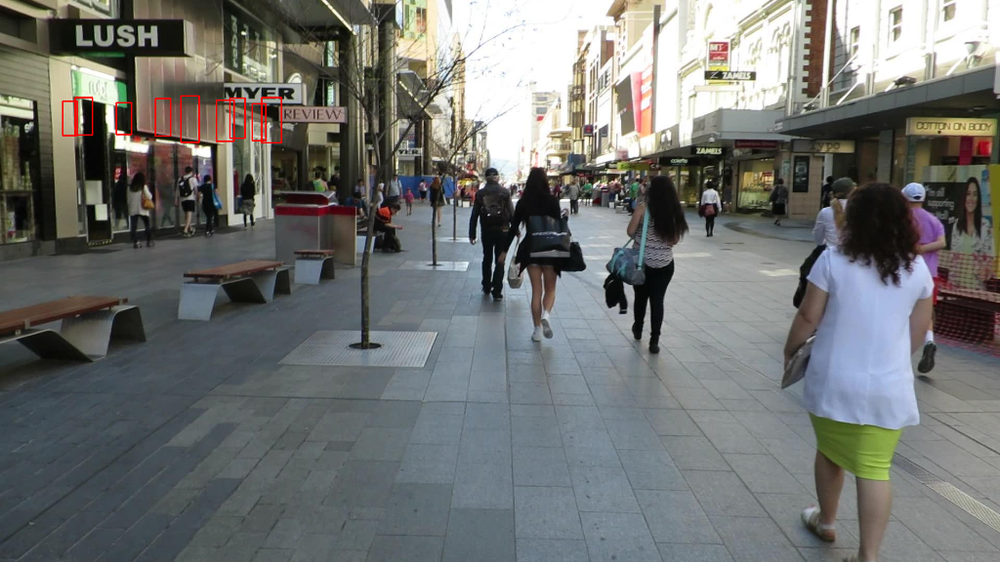

Processing frame 00002


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


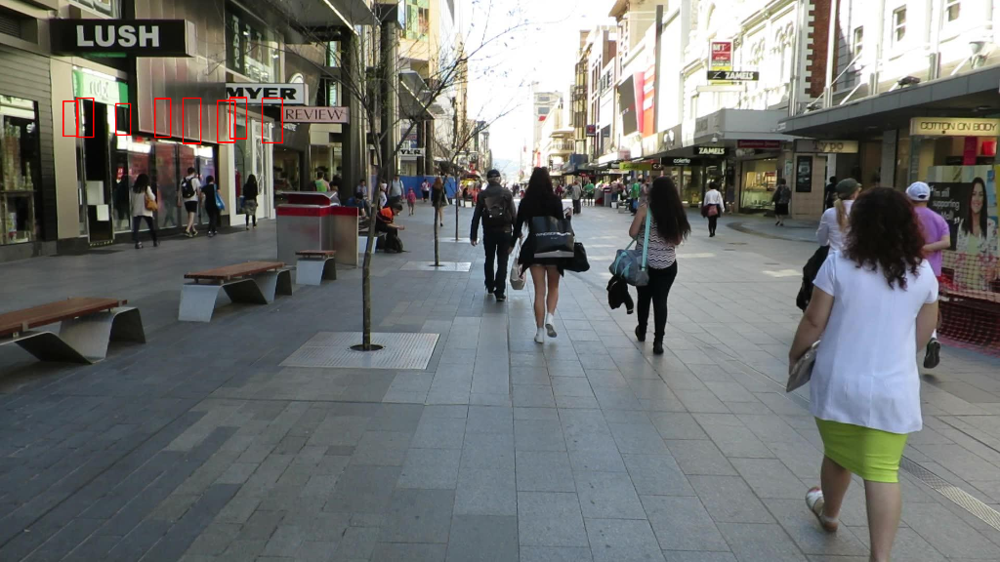

Processing frame 00003


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


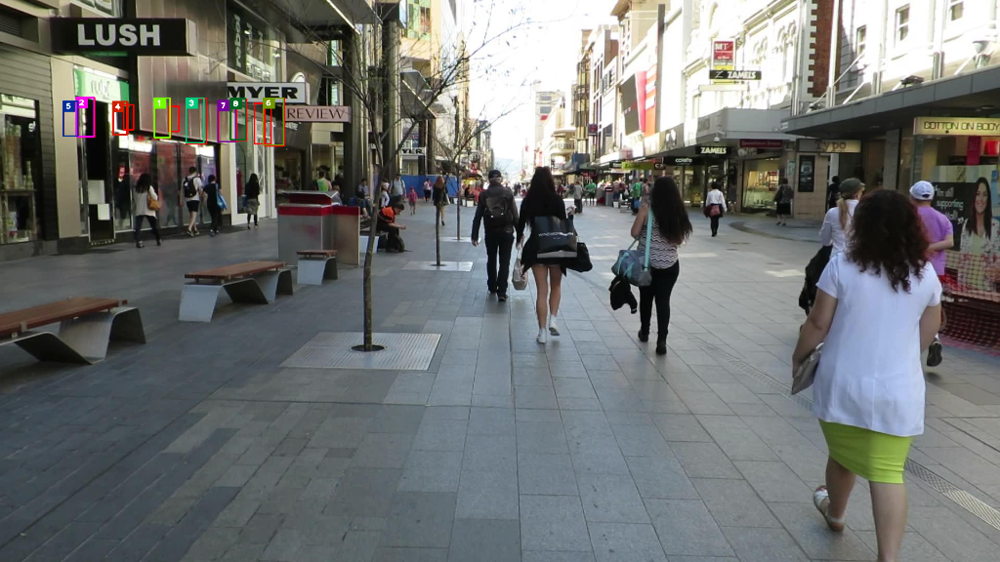

Processing frame 00004


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


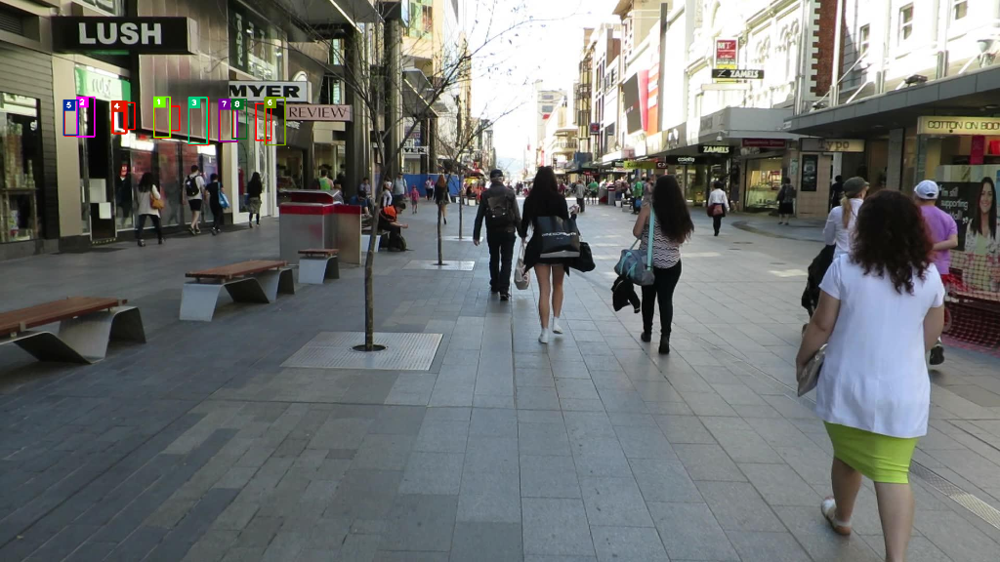

Processing frame 00005


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


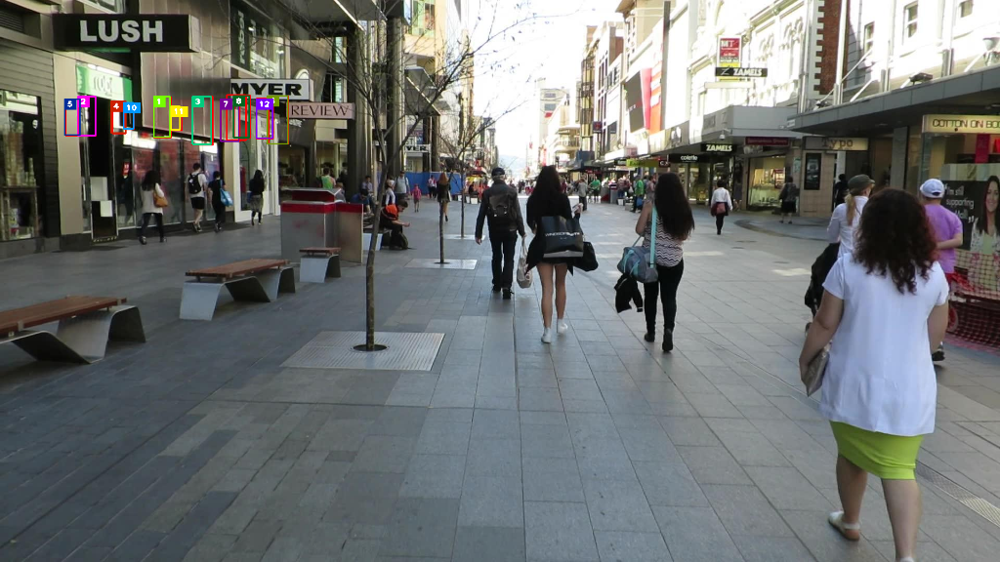

Processing frame 00006


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


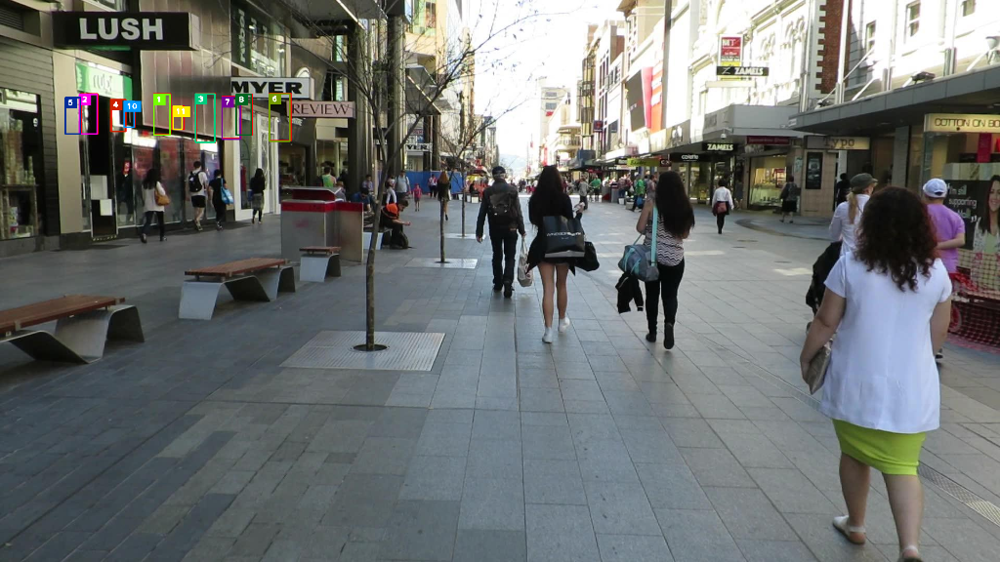

Processing frame 00007


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


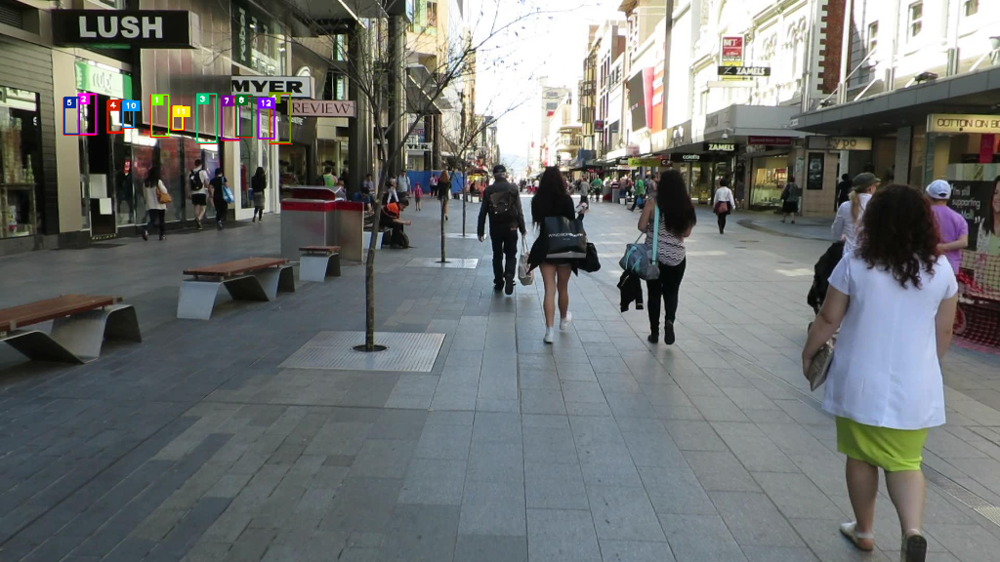

Processing frame 00008


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


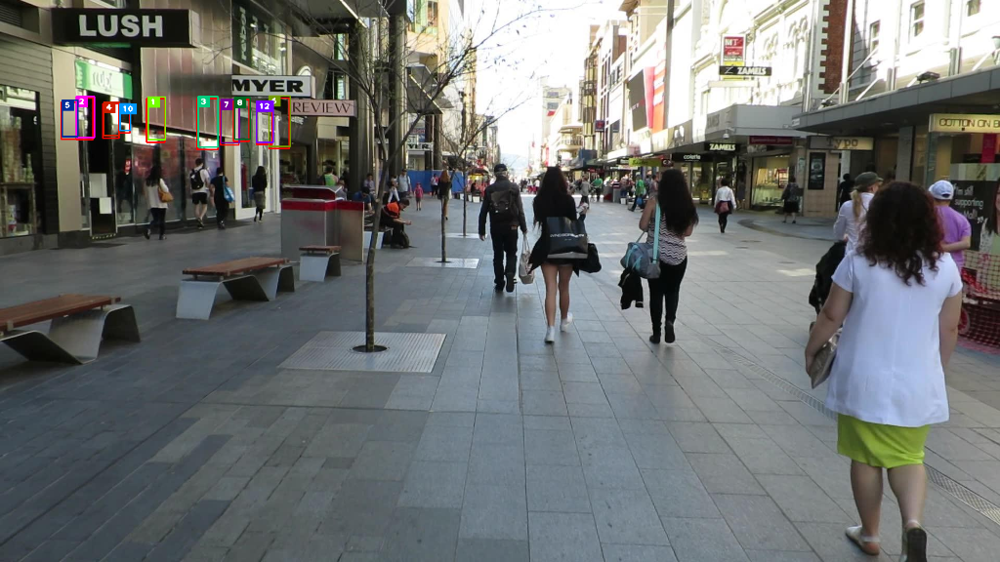

Processing frame 00009


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


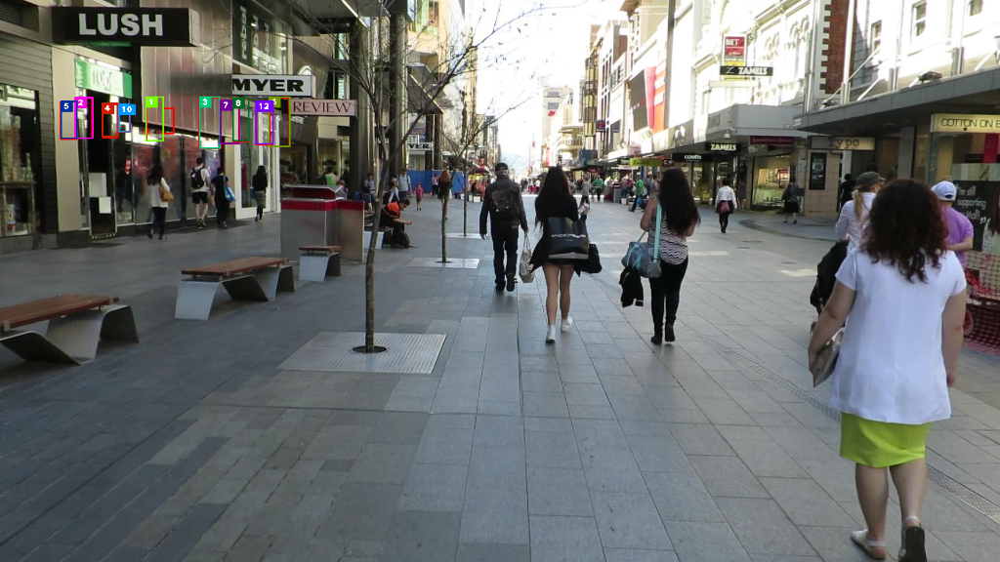

Processing frame 00010


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


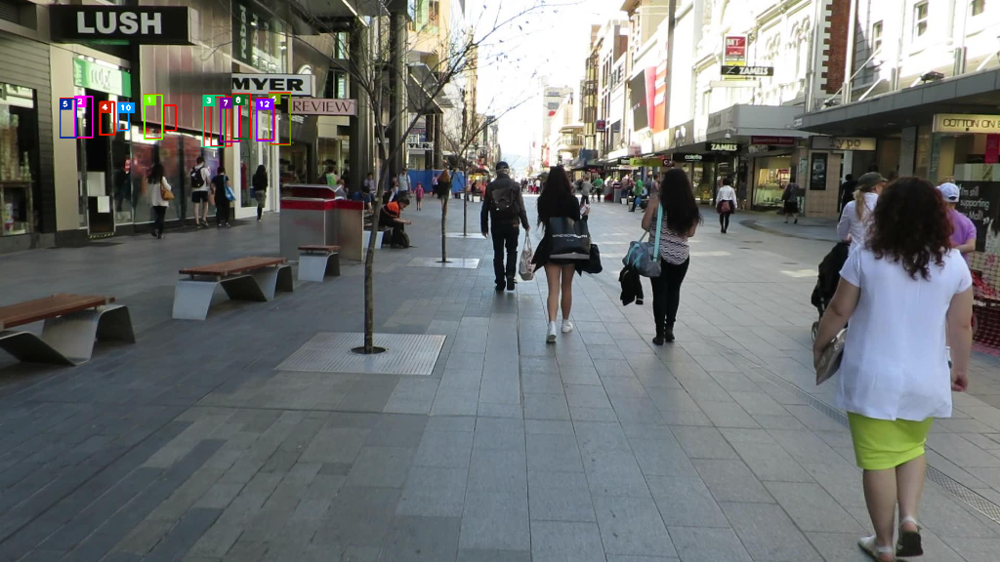

Processing frame 00011


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


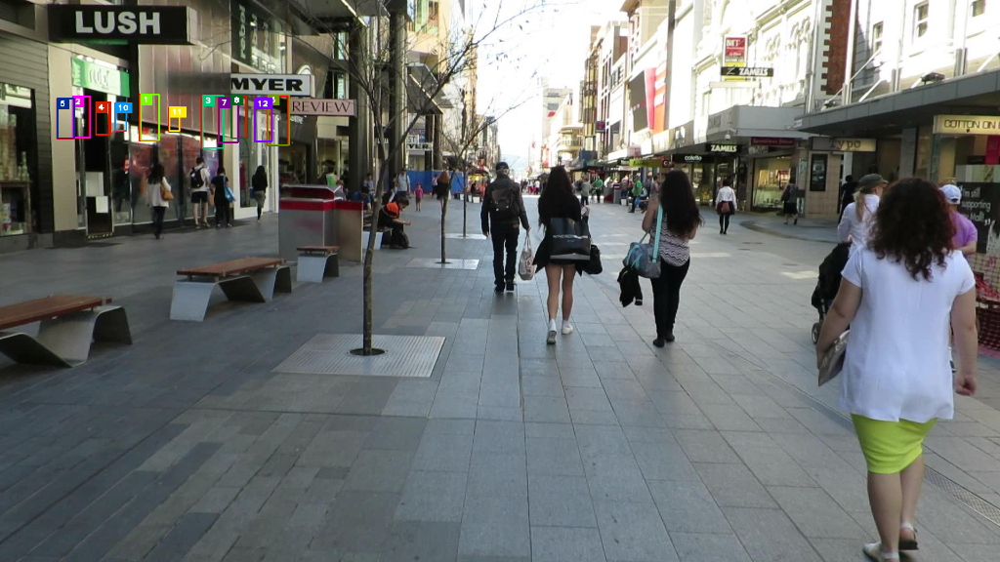

Processing frame 00012


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


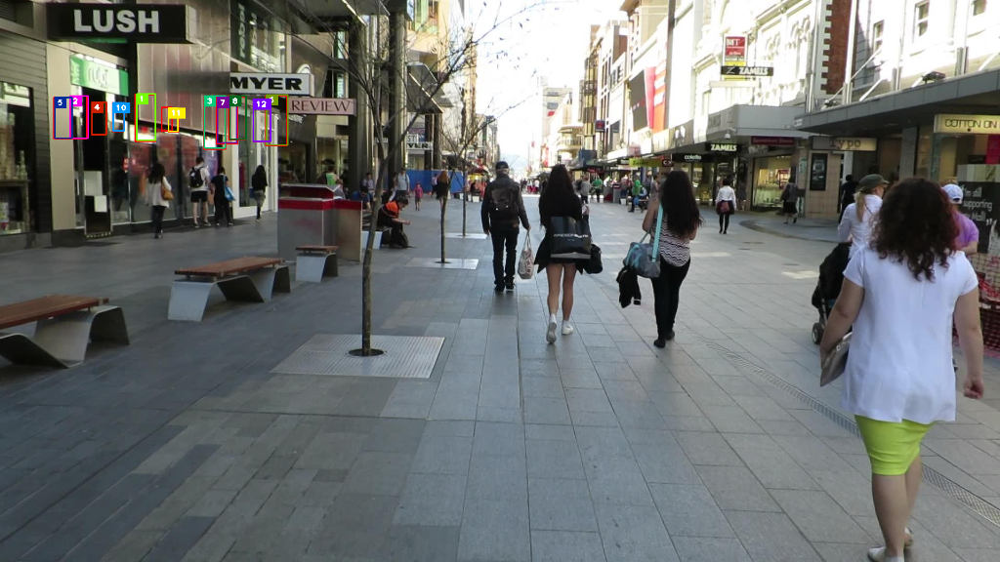

Processing frame 00013


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


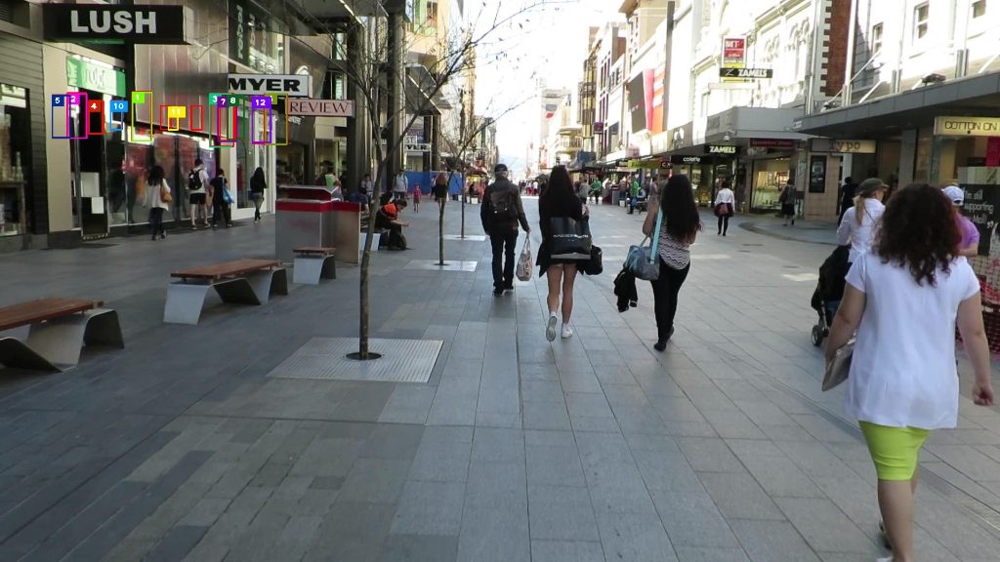

Processing frame 00014


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


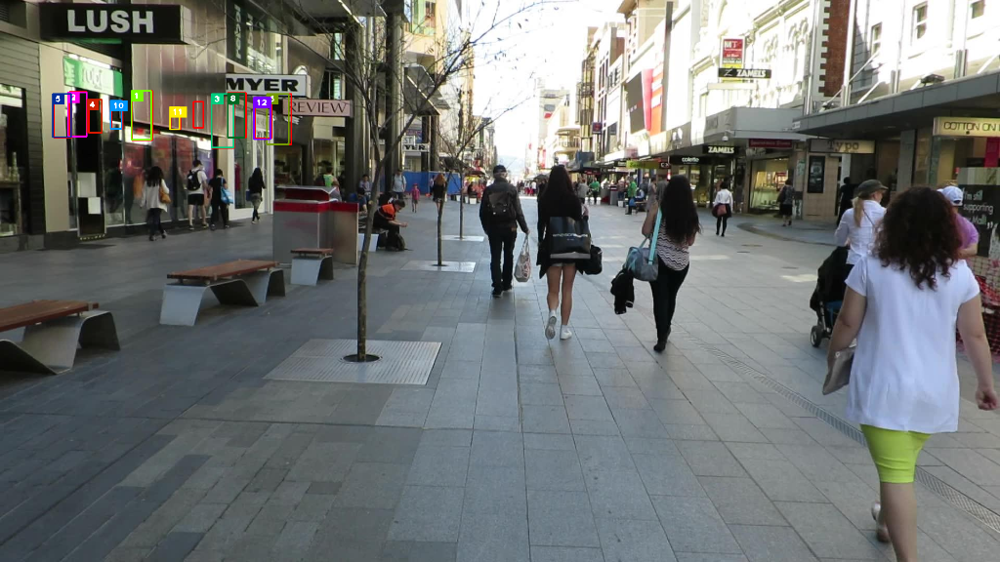

Processing frame 00015


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


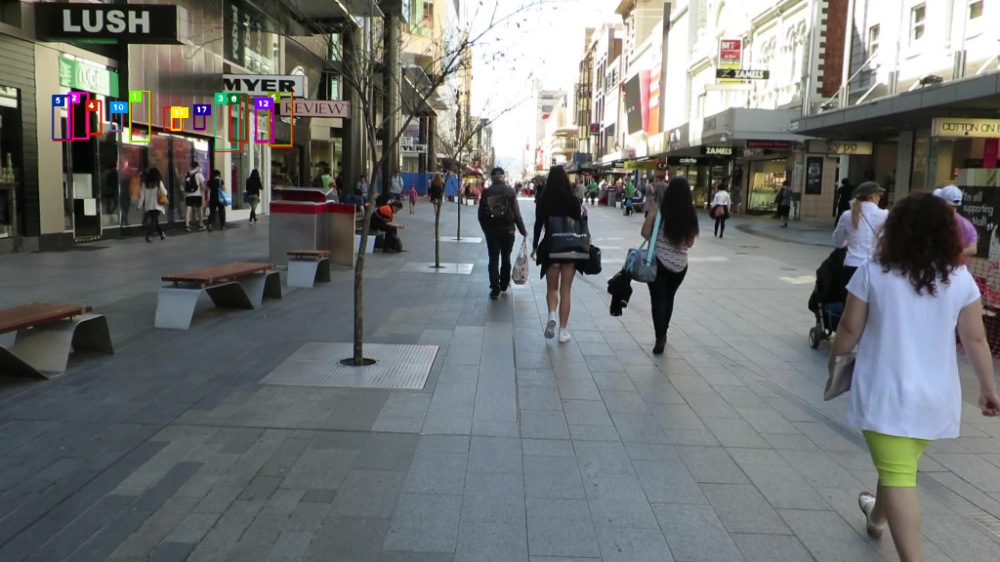

Processing frame 00016


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


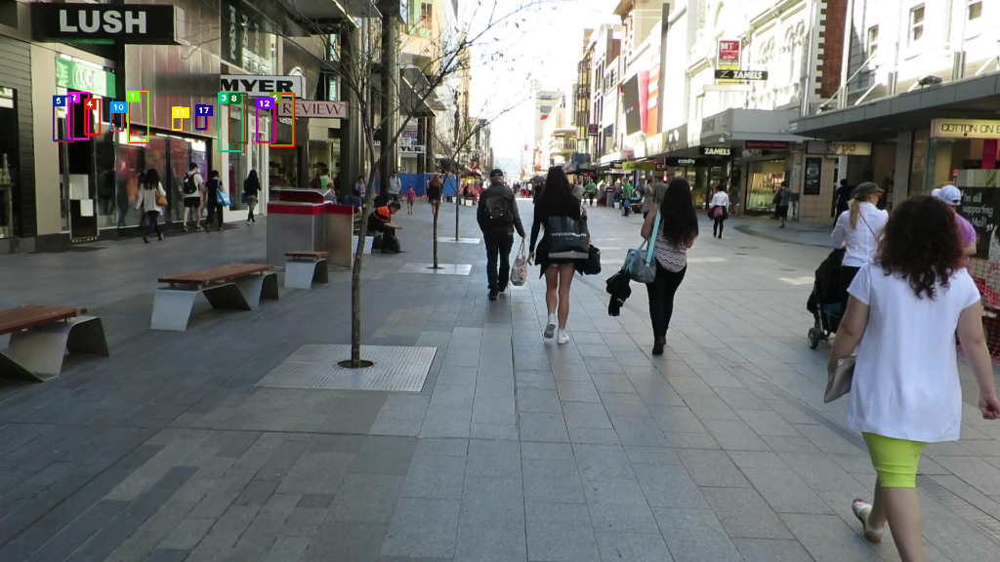

Processing frame 00017


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


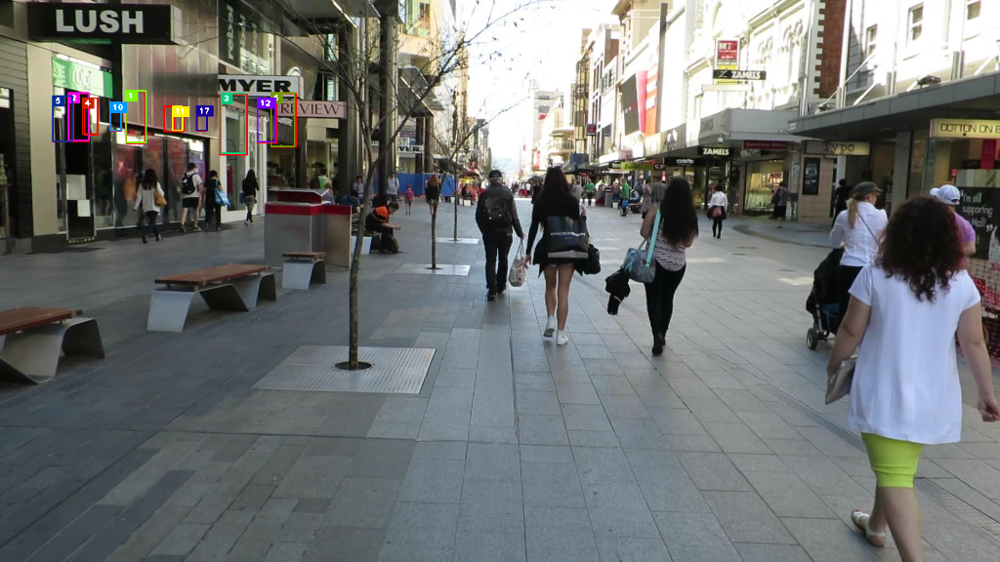

Processing frame 00018


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


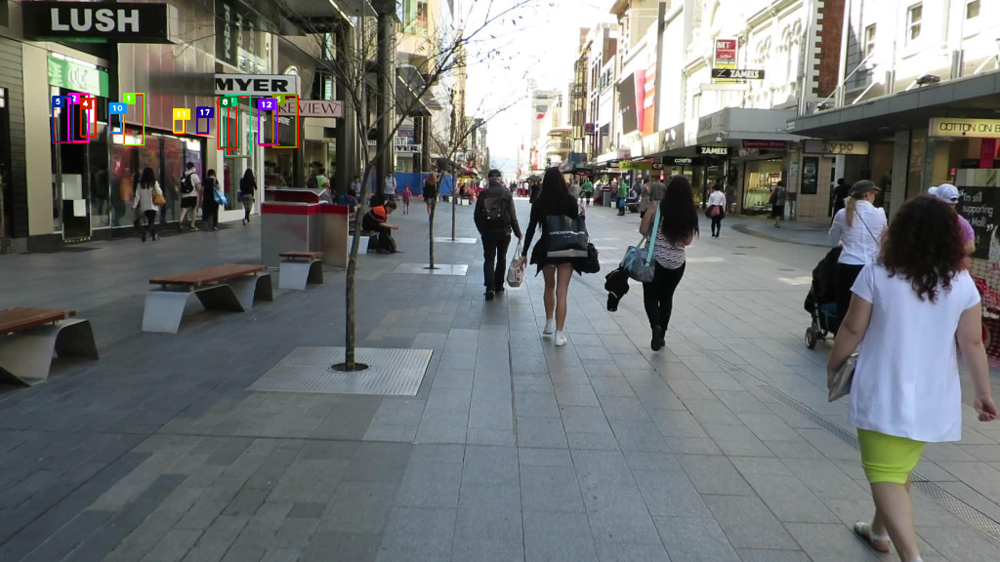

Processing frame 00019


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


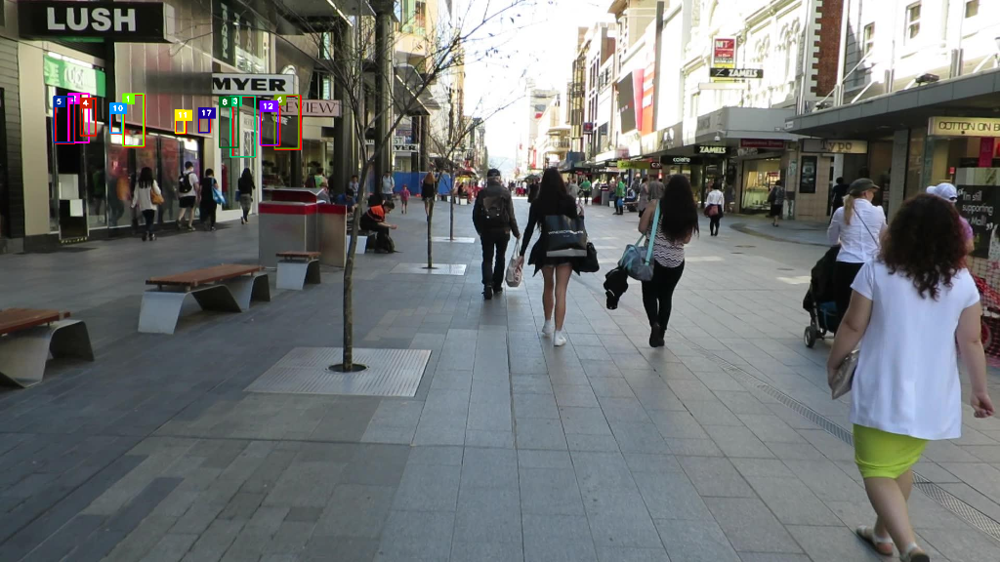

Processing frame 00020


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


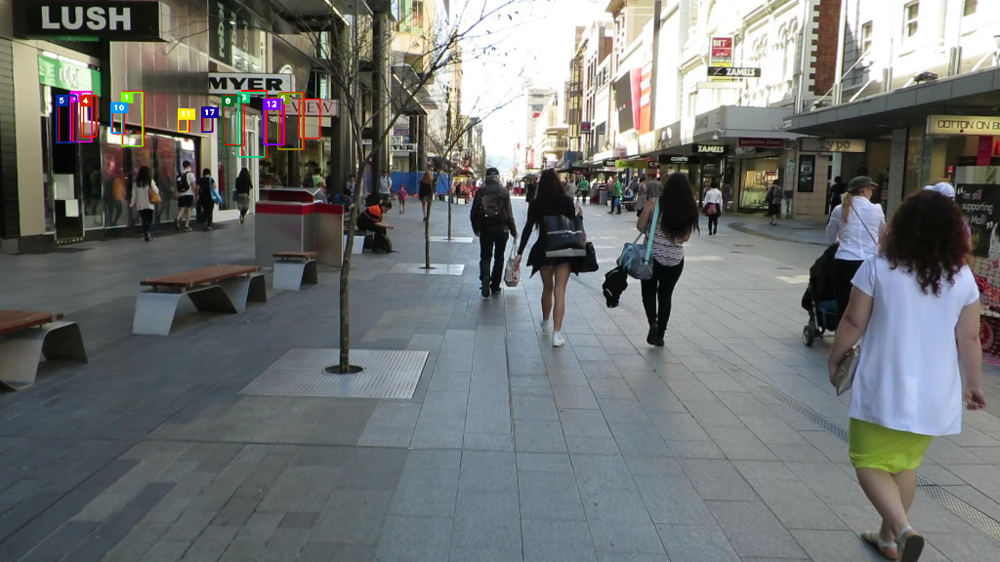

Processing frame 00021


/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/linear_assignment_.py:127: DeprecationWarning: The linear_assignment function is deprecated in 0.21 and will be removed from 0.23. Use scipy.optimize.linear_sum_assignment instead.
  DeprecationWarning)


KeyboardInterrupt: ignored

In [25]:
run(sequence_dir = './MOT16/test/MOT16-07-500', 
    detection_file = './detections/MOT16_POI_test/MOT16-06.npy', 
    output_file = './output_file', 
    min_confidence = 0.3,
    nms_max_overlap = 0.9, 
    min_detection_height = 1, 
    max_cosine_distance = 0.9,
    nn_budget = 100, 
    display = True)

In [24]:
def bool_string(input_string):
    if input_string not in {"True","False"}:
        raise ValueError("Please Enter a valid Ture/False choice")
    else:
        return (input_string == "True")

import argparse
def parse_args():
    """ Parse command line arguments.
    """
    parser = argparse.ArgumentParser(description="Deep SORT")
    parser.add_argument(
        "--sequence_dir", help="Path to MOTChallenge sequence directory",
        default=None, required=True)
    parser.add_argument(
        "--detection_file", help="Path to custom detections.", default=None,
        required=True)
    parser.add_argument(
        "--output_file", help="Path to the tracking output file. This file will"
        " contain the tracking results on completion.",
        default="/tmp/hypotheses.txt")
    parser.add_argument(
        "--min_confidence", help="Detection confidence threshold. Disregard "
        "all detections that have a confidence lower than this value.",
        default=0.8, type=float)
    parser.add_argument(
        "--min_detection_height", help="Threshold on the detection bounding "
        "box height. Detections with height smaller than this value are "
        "disregarded", default=0, type=int)
    parser.add_argument(
        "--nms_max_overlap",  help="Non-maxima suppression threshold: Maximum "
        "detection overlap.", default=1.0, type=float)
    parser.add_argument(
        "--max_cosine_distance", help="Gating threshold for cosine distance "
        "metric (object appearance).", type=float, default=0.2)
    parser.add_argument(
        "--nn_budget", help="Maximum size of the appearance descriptors "
        "gallery. If None, no budget is enforced.", type=int, default=None)
    parser.add_argument(
        "--display", help="Show intermediate tracking results",
        default=True, type=bool_string)
    return parser.parse_args()


if __name__ == "__main__":
    args = parse_args()
    run(
        args.sequence_dir, args.detection_file, args.output_file,
        args.min_confidence, args.nms_max_overlap, args.min_detection_height,
        args.max_cosine_distance, args.nn_budget, args.display)

usage: ipykernel_launcher.py [-h] --sequence_dir SEQUENCE_DIR --detection_file
                             DETECTION_FILE [--output_file OUTPUT_FILE]
                             [--min_confidence MIN_CONFIDENCE]
                             [--min_detection_height MIN_DETECTION_HEIGHT]
                             [--nms_max_overlap NMS_MAX_OVERLAP]
                             [--max_cosine_distance MAX_COSINE_DISTANCE]
                             [--nn_budget NN_BUDGET] [--display DISPLAY]
ipykernel_launcher.py: error: the following arguments are required: --sequence_dir, --detection_file


SystemExit: ignored

/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2890: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)
